In [41]:
import cv2
import numpy as np
import glob
import ntpath


import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Import everything needed to edit/save/watch video clips
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML





%matplotlib inline

In [51]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail or ntpath.basename(head)

def calibrate_camera(objpoints, imgpoints, calibration_image):
    img_size = (img.shape[1], img.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    
    return (ret, mtx, dist, rvecs, tvecs)  

def undistort_image(image, mtx, dist):    
    undistorted_image = cv2.undistort(image, mtx, dist, None, mtx)
    return undistorted_image

def getWarpMatrixes():
    img_size = [1280, 720]
    src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    print(src)
    print(dst)
    return M, M_inv

def warp_perspective(undistored_image, M):
    img_size = (undistored_image.shape[1], undistored_image.shape[0])

    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undistored_image, M, img_size)

    # Return the resulting image and matrix
    return warped

def plot_two_images_side_by_side(image1, image2, title1, title2, cmap, filename):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(cv2.cvtColor(image1, cmap))
    ax1.set_title(title1, fontsize=30)
    ax2.imshow(cv2.cvtColor(image2, cmap))
    ax2.set_title(title2, fontsize=30)
    f.savefig('output_images/result_' + filename)
    
def plot_images_side_by_side(images, titles, cmaps, filename):
    f, axis = plt.subplots(1, len(images), figsize=(20,10))
    for idx, ax in enumerate(axis):
        if cmaps[idx] == 'gray':
            axis[idx].imshow(images[idx], cmap='gray')
        else:
            axis[idx].imshow(images[idx])
        ax.set_title(titles[idx])
    f.savefig('output_images/result_' + filename)
    
M, M_inv = getWarpMatrixes()

[[  585.           460.        ]
 [  203.33332825   720.        ]
 [ 1126.66662598   720.        ]
 [  695.           460.        ]]
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]


In [5]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

In [6]:
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)

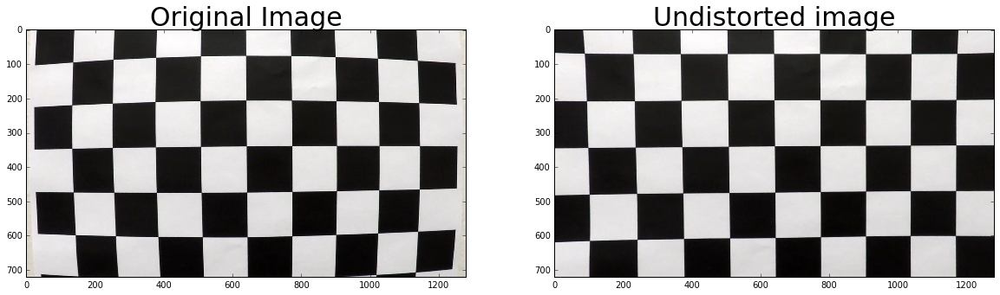

In [46]:
calib_image_name = 'camera_cal/calibration1.jpg'  
img = cv2.imread(calib_image_name)
ret, mtx, dist, rvecs, tvecs = calibrate_camera(objpoints, imgpoints, calib_image_name)
undistort_img = undistort_image(img, mtx, dist) 
plot_two_images_side_by_side(img, undistort_img, 'Original Image', 'Undistorted image', cv2.COLOR_BGR2RGB, 'undistorted_' + path_leaf(calib_image_name))

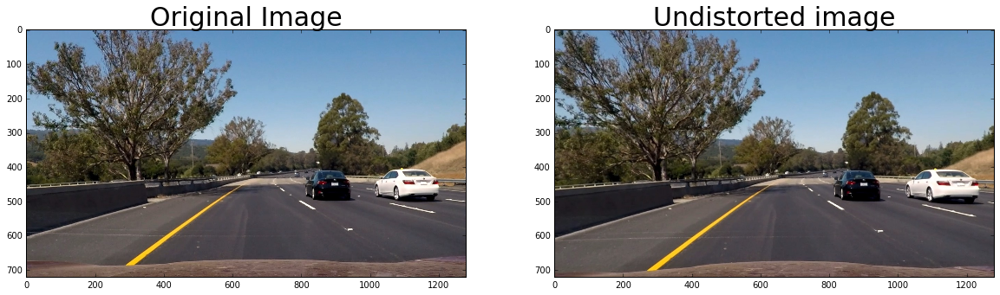

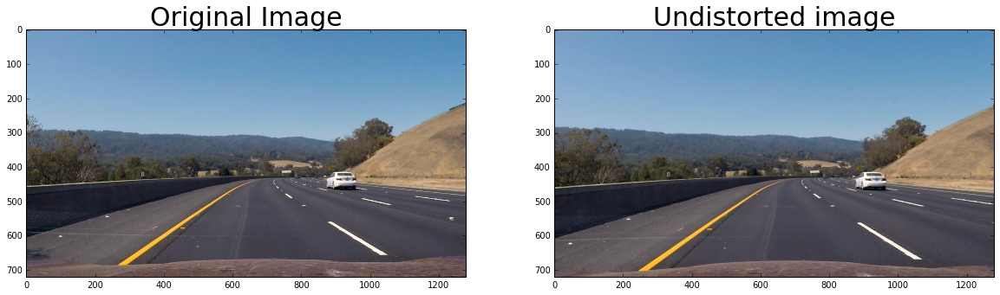

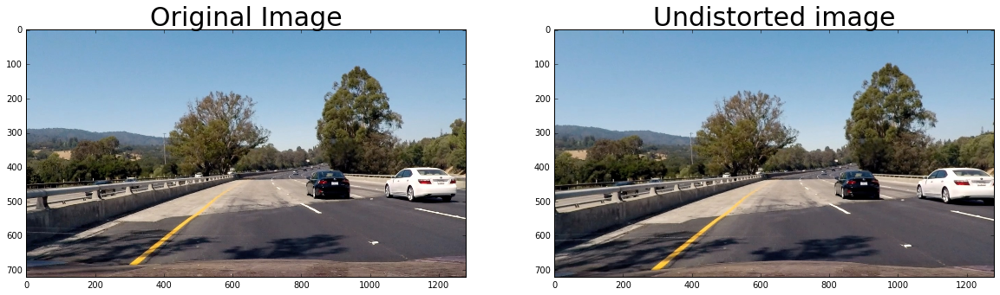

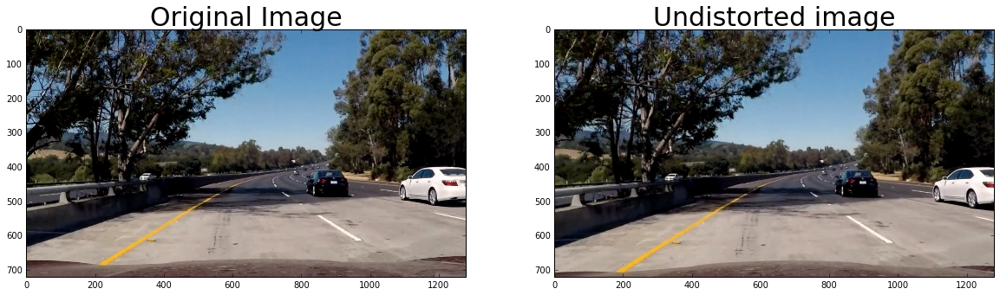

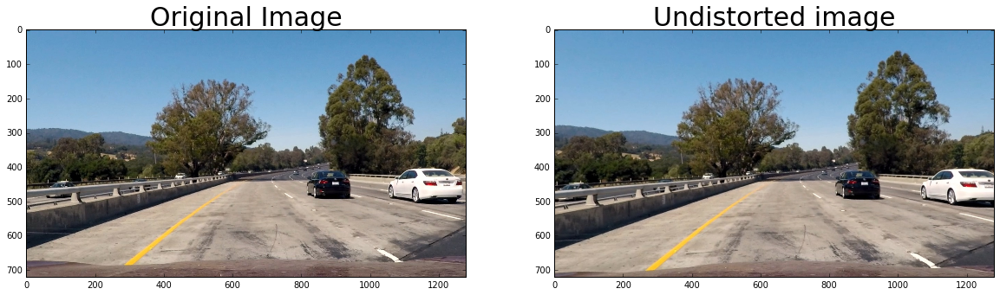

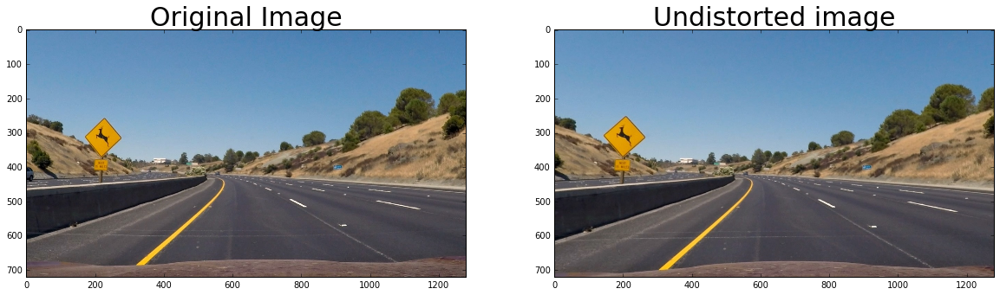

In [47]:
images = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    undistorted_image = undistort_image(image, mtx, dist)
    plot_two_images_side_by_side(image, undistorted_image, 'Original Image', 'Undistorted image', cv2.COLOR_BGR2RGB, 'undistorted_' + path_leaf(fname))

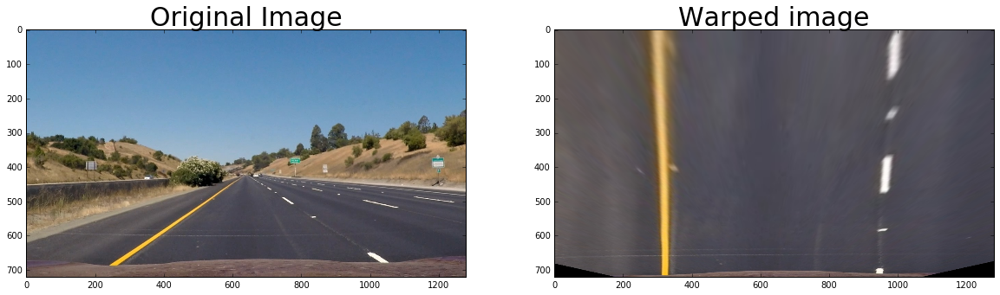

In [48]:
calib_image_name = 'test_images/straight_lines1.jpg'
image = cv2.imread(calib_image_name)
undistort_img = undistort_image(image, mtx, dist)
warped_image = warp_perspective(undistort_img, M)
plot_two_images_side_by_side(image, warped_image, 'Original Image', 'Warped image', cv2.COLOR_BGR2RGB, 'warped_' + path_leaf(calib_image_name))

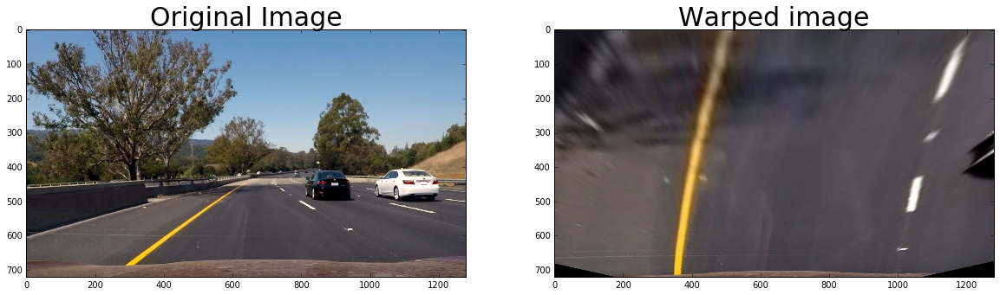

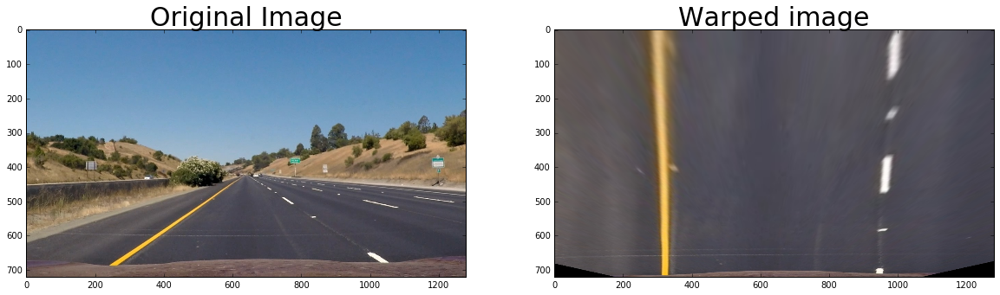

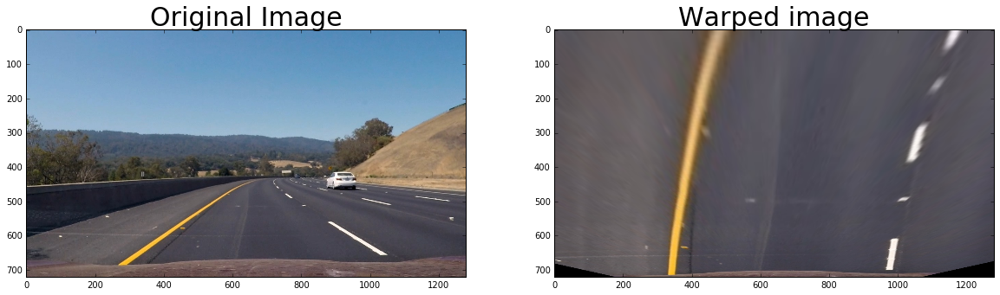

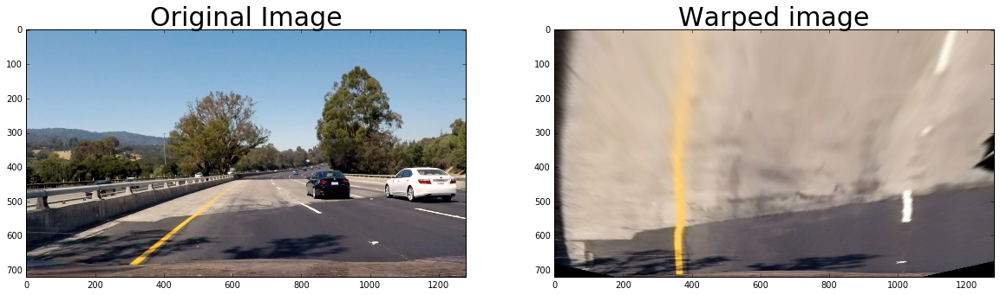

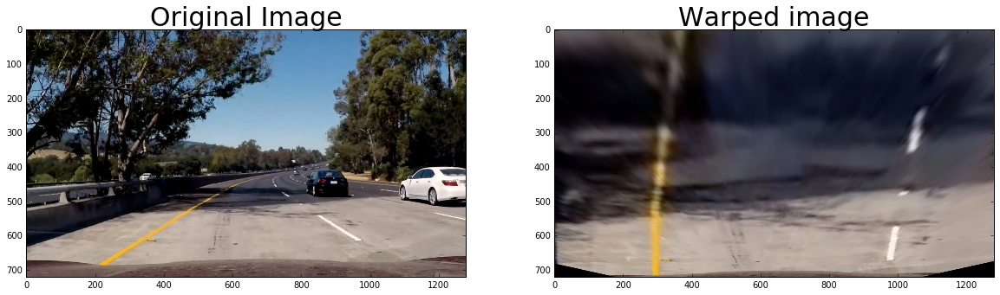

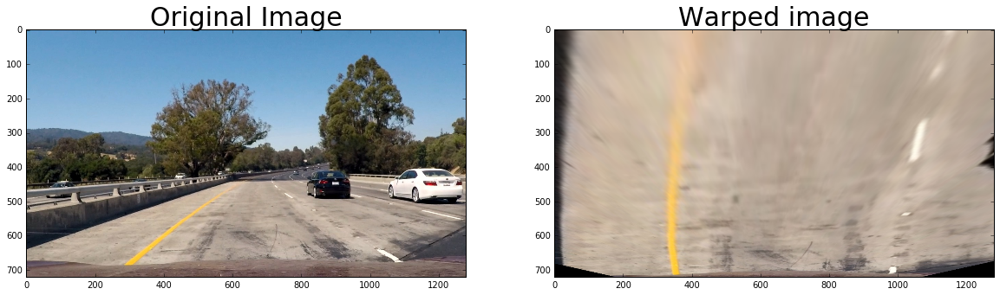

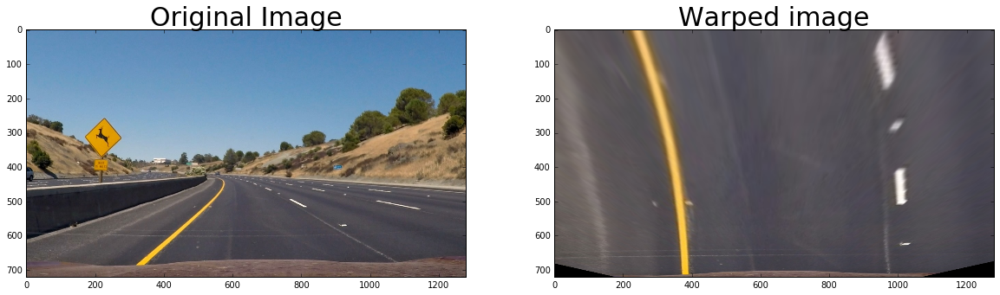

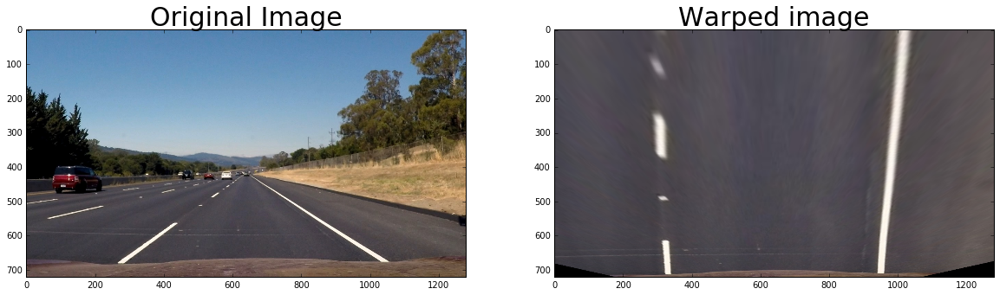

In [49]:
images = glob.glob('test_images/*.jpg')
for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    undistorted_image = undistort_image(image, mtx, dist)
    warped_image = warp_perspective(undistorted_image, M)
    plot_two_images_side_by_side(image, warped_image, 'Original Image', 'Warped image', cv2.COLOR_BGR2RGB, 'warped_' + path_leaf(fname))

In [50]:
def sobelx_threshold(img, thresh_min = 20, thresh_max = 100):
    if len(img.shape) > 2:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    #gray = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sxbinary

def sobely_threshold(img, thresh_min = 20, thresh_max = 100):
    if len(img.shape) > 2:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    #gray = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)

    # Sobel y
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in y
    abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))

    # Threshold x gradient
    sybinary = np.zeros_like(scaled_sobel)
    sybinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return sybinary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def l_threshold(img, thresh_min = 128, thresh_max = 255):
    luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    l_channel = luv[:,:,0]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= thresh_min) & (l_channel <= thresh_max)]  = 1
    return l_binary

def b_threshold(img, thresh_min = 128, thresh_max = 255):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    
    b_channel = lab[:,:,2]
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= thresh_min) & (b_channel <= thresh_max)]  = 1
    
    return b_binary

def s_threshold(img, thresh_min = 128, thresh_max = 255):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh_min) & (s_channel <= thresh_max)]  = 1
    
    return b_binary

def yc_threshold(img, thresh_min = 128, thresh_max = 255):
    ycbcr = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)
    
    yc_channel = ycbcr[:,:,0]
    yc_binary = np.zeros_like(yc_channel)
    yc_binary[(yc_channel >= thresh_min) & (yc_channel <= thresh_max)]  = 1
    return yc_binary

def sharpen_img(img):
    gb = cv2.GaussianBlur(img, (5,5), 20.0)
    return cv2.addWeighted(img, 2, gb, -1, 0)

def apply_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(2,2))    
    img[:,:,0] = clahe.apply(image[:,:,0])
    img[:,:,1] = clahe.apply(image[:,:,1])
    img[:,:,2] = clahe.apply(image[:,:,2])
    return img

def apply_all_thresholds(image):
    img = np.copy(image)
    img = sharpen_img(img)
    #sx_binary = sobelx_threshold(img, 20, 100)
    #sx_binary = np.zeros_like(image[:,:,0])
    #sy_binary = sobely_threshold(img, 20, 100)
    #sy_binary = np.zeros_like(image[:,:,0])
    #sx_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(40, 100))
    b_binary = b_threshold(img, 145, 255)
    yc_binary = yc_threshold(img, 220, 255)
    #yc_binary = l_threshold(img, 225, 255)
  
#     combined_binary_int = np.zeros_like(sx_binary)
#     combined_binary_int[(sx_binary == 1) | (b_binary == 1) | (yc_binary == 1)] = 1
    
#     sx_binary = sobelx_threshold(combined_binary_int, 20, 100)
#     sy_binary = sobely_threshold(combined_binary_int, 40, 100)
    
    combined_binary = np.zeros_like(image[:,:,0])
    combined_binary[(b_binary == 1) | (yc_binary == 1)] = 1
    
    return combined_binary, b_binary, yc_binary

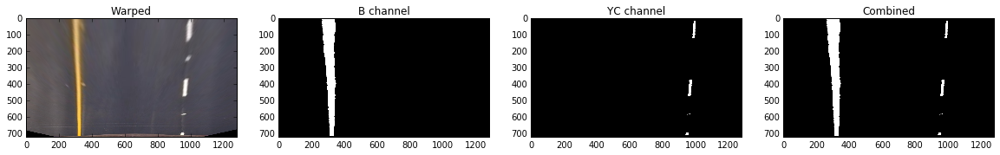

In [52]:
calib_image_name = 'test_images/straight_lines1.jpg'
image = cv2.imread(calib_image_name)
undistort_img = undistort_image(image, mtx, dist)
warped_image = warp_perspective(undistort_img, M)

combined_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)

images=[cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB), b_binary, yc_binary, combined_binary]
titles = ['Warped', 'B channel', 'YC channel', 'Combined']
cmaps = [cv2.COLOR_BGR2RGB, 'gray', 'gray', 'gray']
plot_images_side_by_side(images, titles, cmaps, 'threshold_' + path_leaf(fname))


    

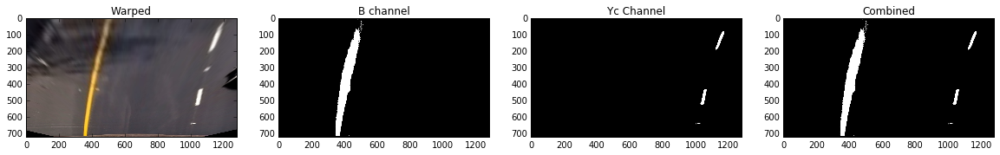

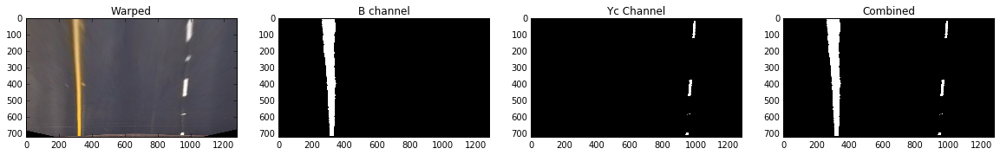

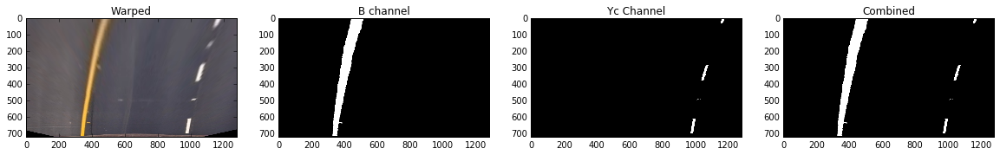

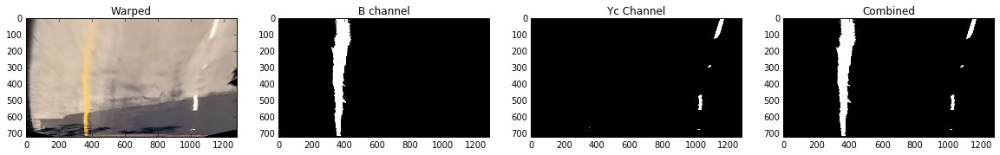

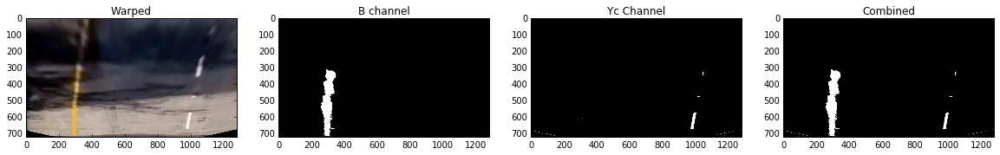

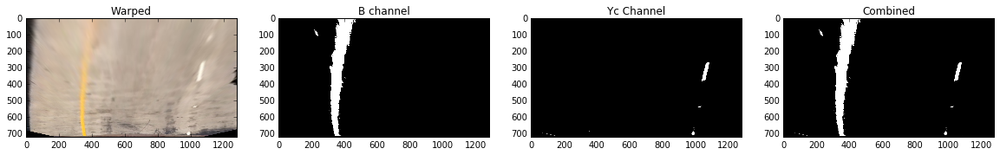

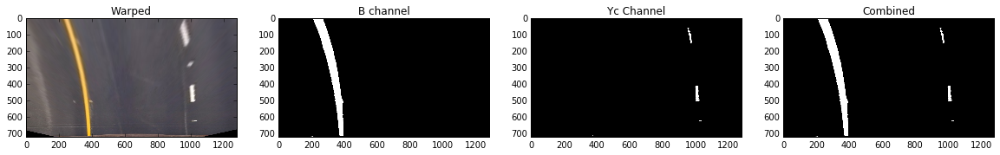

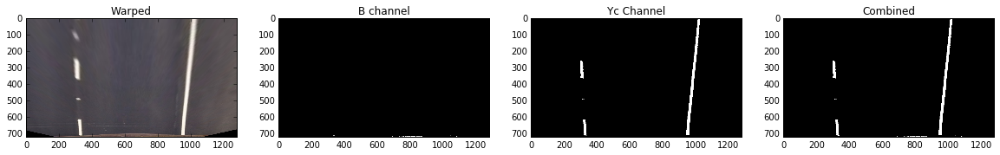

In [15]:
images = glob.glob('test_images/*.jpg')
images_plot = []
titles = ['Warped', 'B channel', 'Yc Channel', 'Combined']
cmaps = [cv2.COLOR_BGR2RGB, 'gray', 'gray', 'gray']
for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    undistorted_image = undistort_image(image, mtx, dist)
    warped_image = warp_perspective(undistorted_image, M) 
    combined_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)  
    images_plot=[cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB), b_binary, yc_binary, combined_binary]
    plot_images_side_by_side(images_plot, titles, cmaps)

In [16]:
def find_line(image):
    undistort_img = undistort_image(image, mtx, dist)
    warped_image = warp_perspective(undistort_img, M)

    combined_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)
    binary_warped = np.copy(combined_binary)
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 100
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    lsort = np.argsort(lefty)
    rsort = np.argsort(righty)
    lefty = lefty[lsort]
    leftx = leftx[lsort]
    righty = righty[rsort]
    rightx = rightx[rsort]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    right_bottom_x = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    left_bottom_x = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    center = 640 - ((right_bottom_x+left_bottom_x)/2)   
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(righty)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(righty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.polylines(warped_image, np.int_([pts]), isClosed=False, color=(255,0,0), thickness = 40)
    cv2.fillPoly(warped_image, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(warped_image, M_inv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result2 = cv2.addWeighted(undistort_img, 1, newwarp, 0.3, 0)
    #plt.imshow(result)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(20, 6))
    ax1.imshow(result)
    ax1.plot(left_fitx, ploty, color='cyan', linewidth=3)
    ax1.plot(right_fitx, ploty, color='cyan', linewidth=3)
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(720, 0)
    ax2.imshow(cv2.cvtColor(result2, cv2.COLOR_BGR2RGB))
    ax2.text(200, 100, 'Vehicle is {:.2f}m of center'.format(center*3.7/700), fontweight='bold' , color='white', fontsize=10)
    ax2.text(200, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)), fontweight='bold' , color='white', fontsize=10)

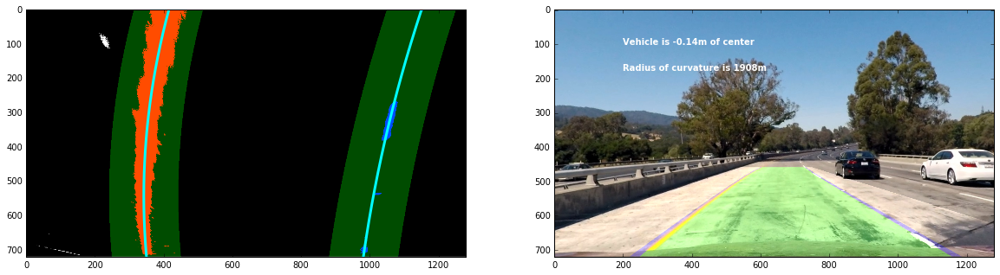

In [17]:
calib_image_name = 'test_images/test1.jpg'
image = cv2.imread(calib_image_name)
find_line(image)

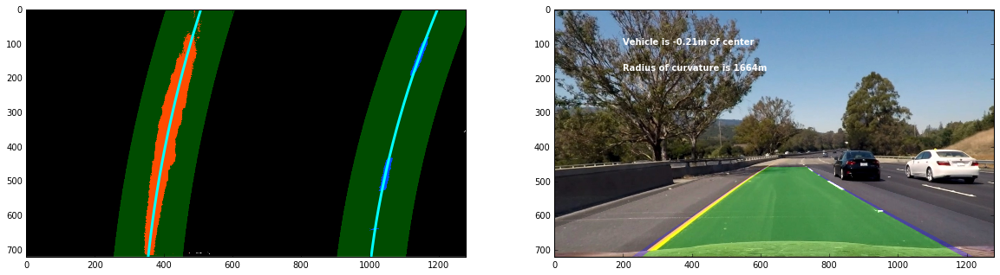

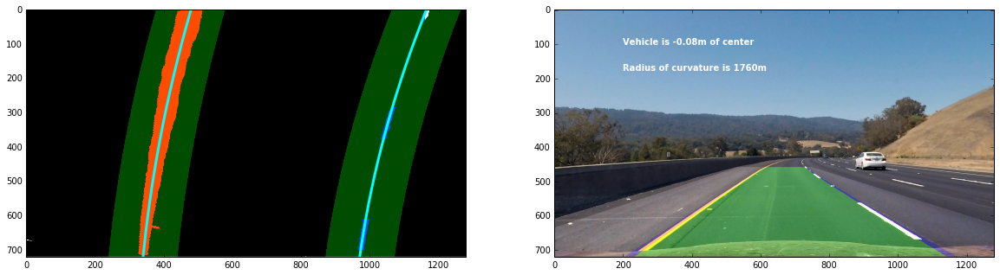

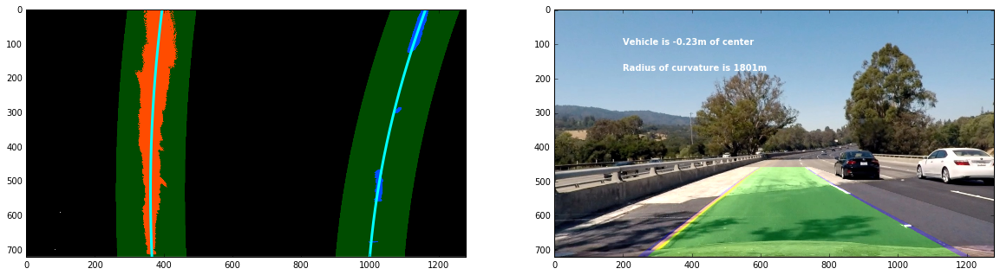

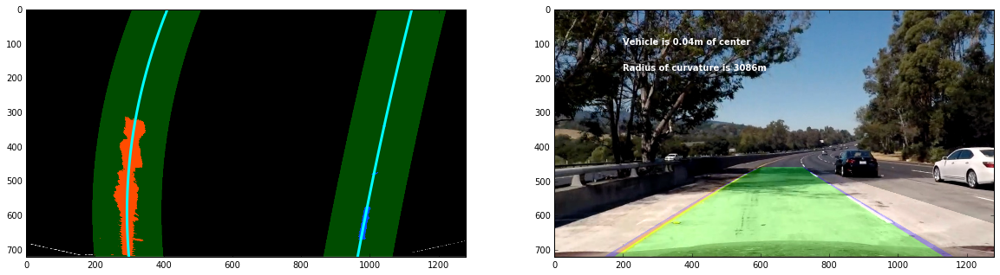

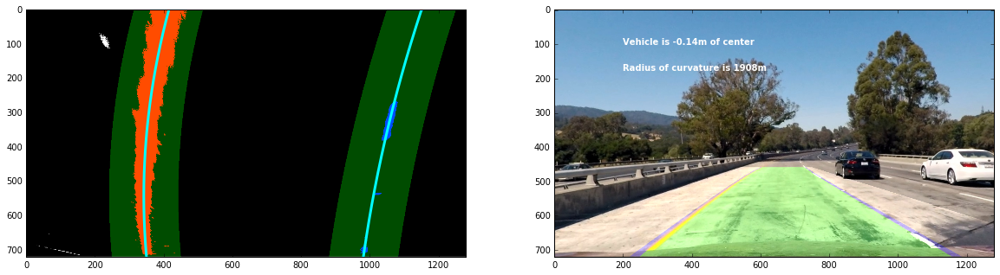

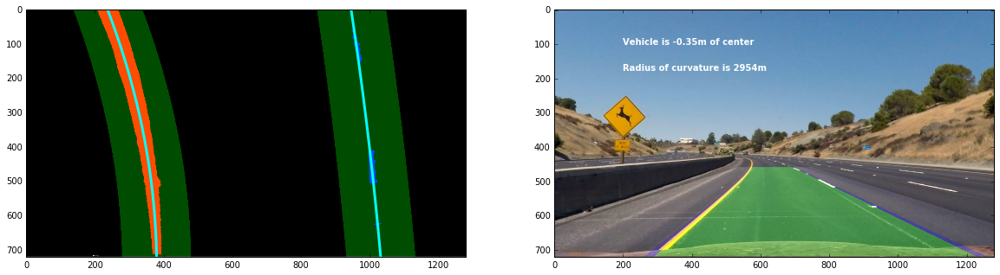

In [18]:
images = glob.glob('test_images/test*.jpg')

for idx, fname in enumerate(images):
    image = cv2.imread(fname)
    find_line(image)

In [22]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = []     
        self.recent_fits = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = [] 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        self.count = 0
        self.n = 5
        self.radius = 0
        
    def fast_search(self, xbase, binary_warped):
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        # It's now much easier to find line pixels!
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 50
        
        if(self.best_fit is None):
            fit = self.current_fit
        else:
            fit = self.best_fit
        
        left_lane_inds = ((nonzerox > (fit[0]*(nonzeroy**2) + fit[1]*nonzeroy + fit[2] - margin)) & (nonzerox < (fit[0]*(nonzeroy**2) + fit[1]*nonzeroy + fit[2] + margin))) 
       
    
        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 

        
        if not(len(leftx) > 0 or len(lefty) > 0):
            print("Bad")
            self.detected = False
        
        return leftx, lefty
            

    
    def blind_search(self, xbase, binary_warped):
        print("blind")
        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = xbase
        # Set the width of the windows +/- margin
        margin = 50
        # Set minimum number of pixels found to recenter window
        minpix = 100
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 

        if not(len(leftx) > 0 or len(lefty) > 0):
            print("Bad")
            self.detected = False
        else:
            self.detected = True
        return leftx, lefty

In [25]:
# Processing pipeline for videos
def process_video(image_clip):
    image_clip = cv2.cvtColor(image_clip, cv2.COLOR_RGB2BGR)
    undistorted_img = undistort_image(image_clip, mtx, dist)
    warped_image = warp_perspective(undistorted_img, M)
    combined_binary, b_binary, yc_binary = apply_all_thresholds(warped_image)
    binary_warped = np.copy(combined_binary)
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    if Right.detected: 
        # Look-ahead
        rightx, righty = Right.fast_search(rightx_base, binary_warped)
    else:
        rightx, righty = Right.blind_search(rightx_base, binary_warped)

    if Left.detected:
        # Look-ahead
        leftx, lefty = Left.fast_search(leftx_base, binary_warped)
    else:
        leftx, lefty = Left.blind_search(leftx_base, binary_warped)

    # Generate x and y values for plotting    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    #if still nothing detected just use the previous fits
    if not Left.detected or not Right.detected:
        if Left.best_fit is None:
            left_fit = Left.current_fit
        else:
            left_fit = Left.best_fit
        leftx = Left.allx
        lefty = Left.ally
        
        if Left.best_fit is None:
            right_fit = Left.current_fit
        else:
            right_fit = Right.best_fit
        rightx = Right.allx
        righty = Right.ally
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
        Left.current_fit = left_fit
        Left.allx = leftx
        Left.ally = lefty
        right_fit = np.polyfit(righty, rightx, 2)
        Right.current_fit = right_fit
        Right.allx = rightx
        Right.ally = righty

    
    #smooth-fit over n frames
    Left.recent_fits.append(left_fit)
    if len(Left.recent_fits) > Left.n:
        Left.recent_fits.pop(0)
        left_fit = np.array(np.nanmean(Left.recent_fits, axis =0))
        Left.best_fit = left_fit
        
    Right.recent_fits.append(right_fit)
    if len(Right.recent_fits) > Right.n:
        Right.recent_fits.pop(0)
        right_fit = np.array(np.nanmean(Right.recent_fits, axis =0))
        Right.best_fit = right_fit
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    #cv2.polylines(warped_image, np.int_([pts]), isClosed=False, color=(255,0,0), thickness = 40)
    cv2.polylines(warped_image, np.int_([pts]), isClosed=False, color=(255,0,0), thickness = 40)
    cv2.fillPoly(warped_image, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(warped_image, M_inv, (image_clip.shape[1], image_clip.shape[0])) 
    # Combine the result with the original image
    result2 = cv2.addWeighted(image_clip, 1, newwarp, 0.3, 0)
    
    right_bottom_x = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    left_bottom_x = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    center = 640 - ((right_bottom_x+left_bottom_x)/2)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(righty)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(righty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    radius = (left_curverad + right_curverad)//2
        
    cv2.putText(result2, 'Vehicle is {:.2f}m of center'.format(center*3.7/700), (100,80), fontFace = cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1, color=(255,255,255), thickness = 2)
    cv2.putText(result2, 'Radius of curvature is {}m'.format(radius), (100,150), fontFace = cv2.FONT_HERSHEY_SIMPLEX, fontScale = 1, color=(255,255,255), thickness = 2)

    
    final = cv2.cvtColor(result2, cv2.COLOR_BGR2RGB)
    return final
    

In [31]:
Left = Line()
Right = Line()
video_outputx = './result.mp4'
#clip1 = VideoFileClip("project_video.mp4").subclip(0,10)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_video) 
white_clip.write_videofile(video_outputx, audio=False)



blind
blind
[MoviePy] >>>> Building video ./result.mp4
[MoviePy] Writing video ./result.mp4


100%|█████████▉| 1260/1261 [02:53<00:00,  7.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./result.mp4 



In [ ]:
import io
import base64
from IPython.display import HTML

video = io.open('result.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" width="960" height="540" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

